In [ ]:
import torch
from src.model.generator import * 
from src.model.discriminator import * 
from src.training.loop_stylegan import *
from src.data.load_data_from_torch import * 
from src.data.load_data_local import *

In [ ]:
train_loader, val_loader, test_loader = get_celeba_loaders(
    root="./data",
    img_size=64,
    batch_size=128,
    num_workers=2
)

In [4]:
imgs, _ = next(iter(train_loader))
imgs.shape

torch.Size([128, 3, 64, 64])

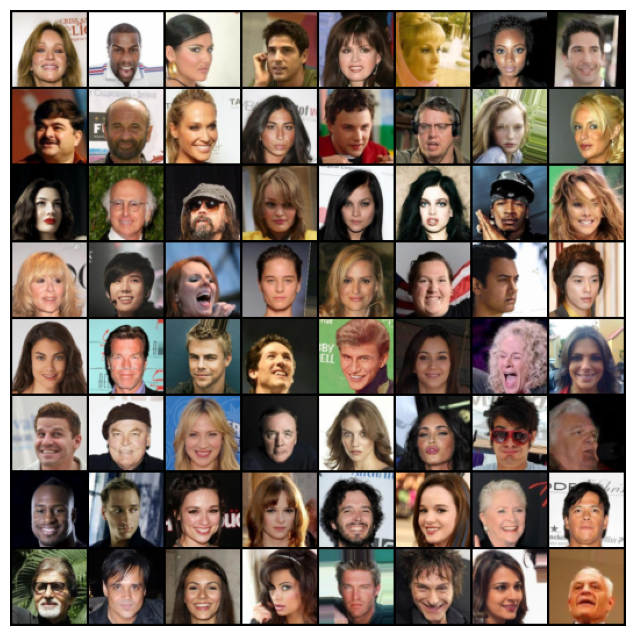

In [5]:
import matplotlib.pyplot as plt
import torchvision

imgs, _ = next(iter(train_loader))
imgs = (imgs * 0.5) + 0.5
grid = torchvision.utils.make_grid(imgs[:64], nrow=8)

plt.figure(figsize=(8,8))
plt.axis("off")
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
plt.show()

# **Model**


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

G = StyleGANGenerator64(
    z_dim=512, w_dim=512, n_mapping=8,
    ch_schedule=(512, 512, 256, 128, 64),
    truncation_psi=0.7,
    truncation_layers=8 ).to(device)

D = Discriminator64(base_ch=64, max_ch=512, in_channels=3).to(device)

lr_G = 3e-3
lr_D = 1e-3

optimizerG = torch.optim.Adam(G.parameters(), lr=lr_G, betas=(0.0, 0.99))
optimizerD = torch.optim.Adam(D.parameters(), lr=lr_D, betas=(0.0, 0.99))
criterion = nn.BCEWithLogitsLoss()


In [ ]:
total_params = sum(p.numel() for p in G.parameters())
print(f"Total parámetros Generador: {total_params}")

Total parámetros Generador: 14112707


In [ ]:
total_params = sum(p.numel() for p in D.parameters())
print(f"Total parámetros Discriminador: {total_params}")

Total parámetros Discriminador: 9845697


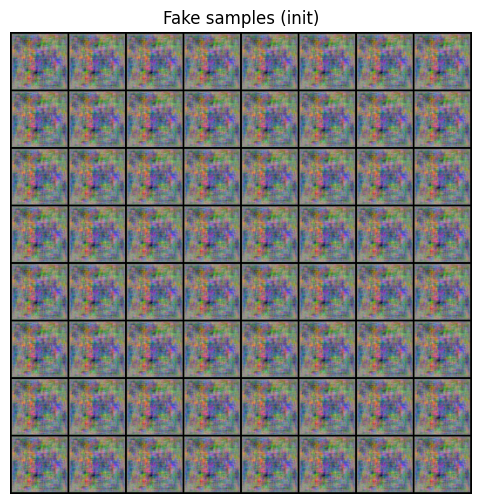

[Epoch 001/30] loss_D=2.0024 | loss_G=0.0067 | D(real)=0.36 | D(fake)=0.36 | Dsteps=1 | Gsteps=1
[Epoch 002/30] loss_D=1.4318 | loss_G=0.7343 | D(real)=0.66 | D(fake)=-0.01 | Dsteps=1 | Gsteps=1
[Epoch 003/30] loss_D=1.2504 | loss_G=0.9071 | D(real)=0.54 | D(fake)=-1.76 | Dsteps=1 | Gsteps=1


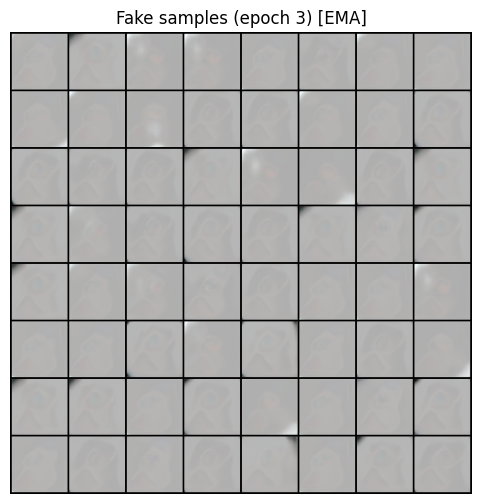

[Epoch 004/30] loss_D=1.2076 | loss_G=0.9062 | D(real)=0.57 | D(fake)=-1.27 | Dsteps=1 | Gsteps=1
[Epoch 005/30] loss_D=1.1257 | loss_G=0.9619 | D(real)=0.51 | D(fake)=-1.43 | Dsteps=1 | Gsteps=1
[Epoch 006/30] loss_D=1.0896 | loss_G=1.0228 | D(real)=0.58 | D(fake)=-2.19 | Dsteps=1 | Gsteps=1


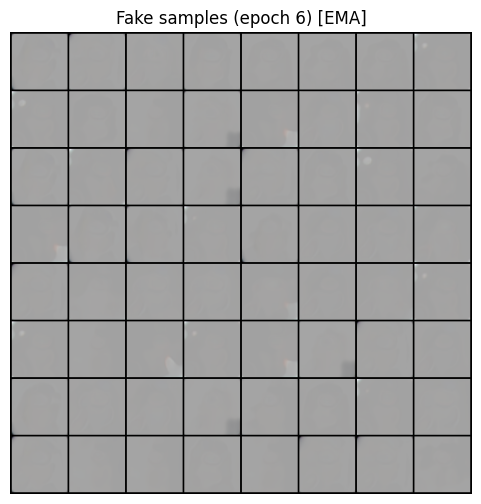

[Epoch 007/30] loss_D=1.1049 | loss_G=1.0035 | D(real)=1.15 | D(fake)=-1.44 | Dsteps=1 | Gsteps=1
[Epoch 008/30] loss_D=1.1284 | loss_G=1.0732 | D(real)=1.12 | D(fake)=-1.89 | Dsteps=1 | Gsteps=1
[Epoch 009/30] loss_D=1.1031 | loss_G=1.1174 | D(real)=0.48 | D(fake)=-1.56 | Dsteps=1 | Gsteps=1


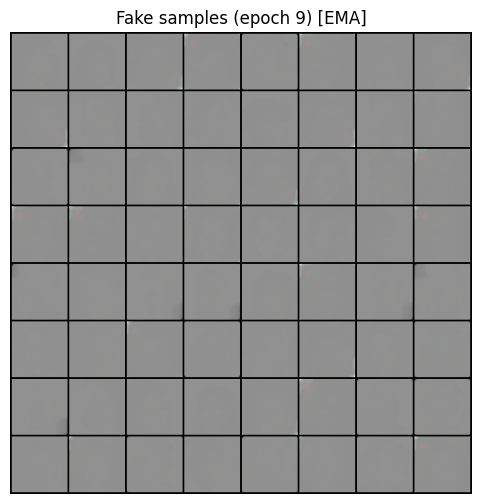

KeyboardInterrupt: 

In [ ]:
history = train_gan(
    train_loader=train_loader,   # CelebA 64×64
    generador=G,
    discriminador=D,
    optimizerG=optimizerG,
    optimizerD=optimizerD,
    criterion=criterion,         # ignorado si hinge=True
    latent_dim=512,
    epochs=30,
    gamma=10,                    # coeficiente de R1
    monitor_img=3,               # guarda/visualiza cada 5 epochs
    monitor_loss=1,
    train_gen=1,
    hinge=True,                 # Usamos HINGE + R1 porque no hay SN en discriminador
    disc_steps=1,                # 1 entrenamiento del discriminador
    g_warmup_epochs=0,
    g_warmup_train_gen=1,        # No entrenamos mas veces el generador
    use_ema=True,                # Usamos ema para predecir
    ema_decay=0.999,
    use_diffaug=True,
    r1_every=16 ) # Cada 16 steps R1 penalty

In [35]:
for param_group in optimizerG.param_groups:
    param_group['lr'] = 3.1e-3

for param_group in optimizerD.param_groups:
    param_group['lr'] = 1e-3

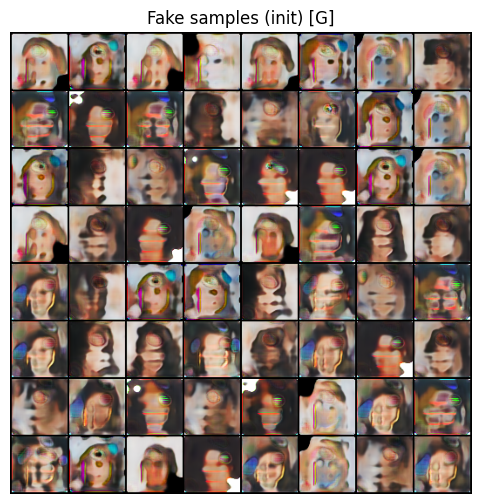

[Epoch 001/15] loss_D=1.1029 | loss_G=1.0575 | D(real)=0.49 | D(fake)=-2.80 | Dsteps=1 | Gsteps=1
[Epoch 002/15] loss_D=1.0976 | loss_G=1.0932 | D(real)=0.60 | D(fake)=-2.92 | Dsteps=1 | Gsteps=1
[Epoch 003/15] loss_D=1.0636 | loss_G=1.2111 | D(real)=1.23 | D(fake)=0.20 | Dsteps=1 | Gsteps=1


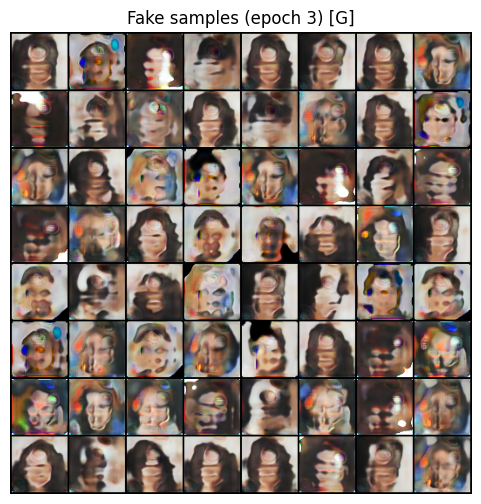

[Epoch 004/15] loss_D=1.0561 | loss_G=1.1960 | D(real)=0.51 | D(fake)=-0.65 | Dsteps=1 | Gsteps=1
[Epoch 005/15] loss_D=1.0531 | loss_G=1.1247 | D(real)=0.65 | D(fake)=0.07 | Dsteps=1 | Gsteps=1
[Epoch 006/15] loss_D=1.0040 | loss_G=1.3945 | D(real)=0.84 | D(fake)=0.26 | Dsteps=1 | Gsteps=1


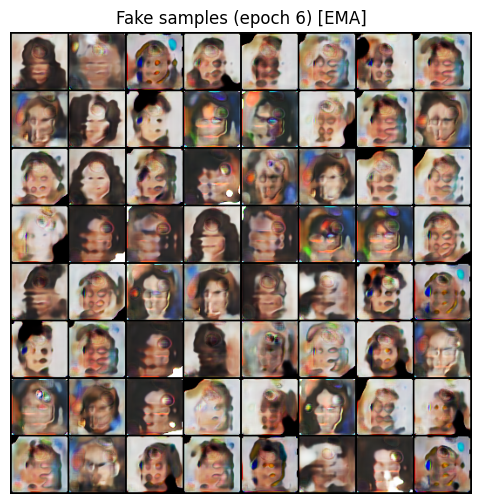

[Epoch 007/15] loss_D=1.0482 | loss_G=1.2275 | D(real)=1.34 | D(fake)=-1.72 | Dsteps=1 | Gsteps=1
[Epoch 008/15] loss_D=0.9855 | loss_G=1.3340 | D(real)=1.33 | D(fake)=-2.38 | Dsteps=1 | Gsteps=1
[Epoch 009/15] loss_D=1.0768 | loss_G=1.1614 | D(real)=1.50 | D(fake)=-2.01 | Dsteps=1 | Gsteps=1


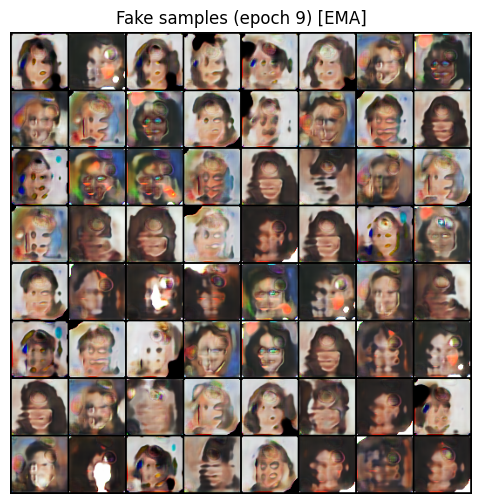

[Epoch 010/15] loss_D=1.0153 | loss_G=1.2651 | D(real)=1.27 | D(fake)=0.34 | Dsteps=1 | Gsteps=1
[Epoch 011/15] loss_D=1.0072 | loss_G=1.2677 | D(real)=0.36 | D(fake)=-0.12 | Dsteps=1 | Gsteps=1
[Epoch 012/15] loss_D=1.0123 | loss_G=1.3170 | D(real)=0.71 | D(fake)=-2.01 | Dsteps=1 | Gsteps=1


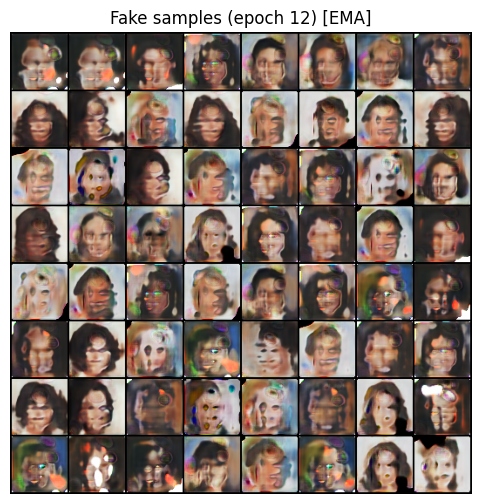

[Epoch 013/15] loss_D=0.9935 | loss_G=1.3437 | D(real)=1.48 | D(fake)=0.38 | Dsteps=1 | Gsteps=1
[Epoch 014/15] loss_D=1.0672 | loss_G=1.2443 | D(real)=0.24 | D(fake)=-0.73 | Dsteps=1 | Gsteps=1
[Epoch 015/15] loss_D=1.0126 | loss_G=1.3524 | D(real)=1.28 | D(fake)=-2.22 | Dsteps=1 | Gsteps=1


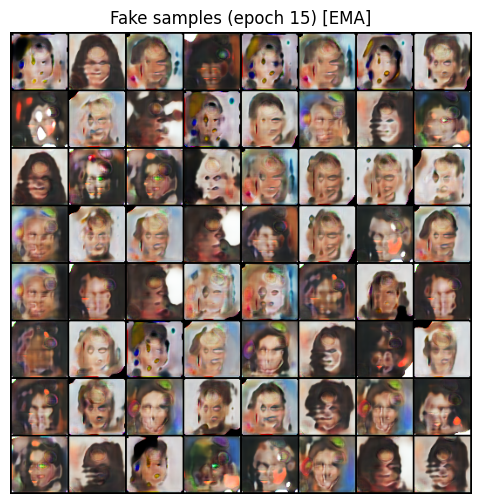

In [ ]:
history = train_gan(
    train_loader=train_loader,   # CelebA 64×64
    generador=G,
    discriminador=D,
    optimizerG=optimizerG,
    optimizerD=optimizerD,
    criterion=criterion,         # ignorado si hinge=True
    latent_dim=512,
    epochs=15,
    gamma=9,                    # coeficiente de R1
    monitor_img=3,               # guarda/visualiza cada 5 epochs
    monitor_loss=1,
    train_gen=1,
    hinge=True,                  # Usamos HINGE + R1 porque no hay SN en discriminador
    disc_steps=1,                # 1 entrenamiento del discriminador
    g_warmup_epochs=0,
    g_warmup_train_gen=1,        # No entrenamos mas veces el generador
    use_ema=True,                # Usamos ema para predecir
    ema_decay=0.999,
    use_diffaug=True,
    r1_every=16 ) # Cada 16 steps R1 penalty

## Save Chekpoiont


In [42]:
from re import DEBUG

torch.save({
    'epoch': 35,
    'gen_state_dict': G.state_dict(),
    'disc_state_dict': D.state_dict(),
    'optimizer_gen_state_dict': optimizerG.state_dict(),
    'optimizer_disc_state_dict': optimizerD.state_dict(),
    'loss_G': history['loss_G'],
    'loss_D': history['loss_D']
}, "checkpoint_stylegan.pth")

## Load Chekpoin


In [43]:
checkpoint = torch.load("/content/checkpoint_stylegan.pth", map_location=device)

G.load_state_dict(checkpoint['gen_state_dict'])
D.load_state_dict(checkpoint['disc_state_dict'])

optimizerG.load_state_dict(checkpoint['optimizer_gen_state_dict'])
optimizerD.load_state_dict(checkpoint['optimizer_disc_state_dict'])

for opt in (optimizerG, optimizerD):
    for state in opt.state.values():
        for k, v in state.items():
            if torch.is_tensor(v):
                state[k] = v.to(device)

In [51]:
for param_group in optimizerG.param_groups:
    param_group['lr'] = 2e-3

for param_group in optimizerD.param_groups:
    param_group['lr'] = 2.6e-3

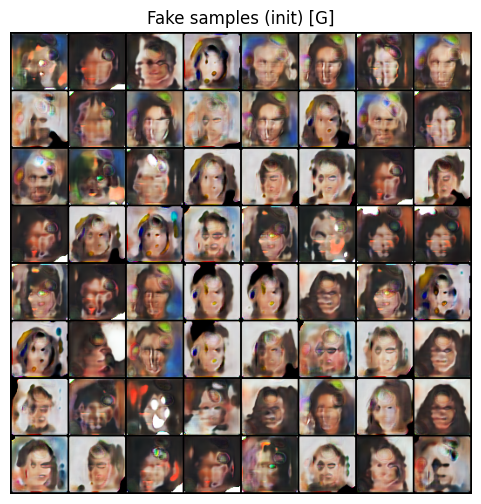

[Epoch 001/10] loss_D=0.9634 | loss_G=1.4663 | D(real)=1.01 | D(fake)=-2.23 | Dsteps=1 | Gsteps=1
[Epoch 002/10] loss_D=1.0216 | loss_G=1.3353 | D(real)=0.71 | D(fake)=-2.58 | Dsteps=1 | Gsteps=1
[Epoch 003/10] loss_D=0.9865 | loss_G=1.4569 | D(real)=0.69 | D(fake)=-3.33 | Dsteps=1 | Gsteps=1


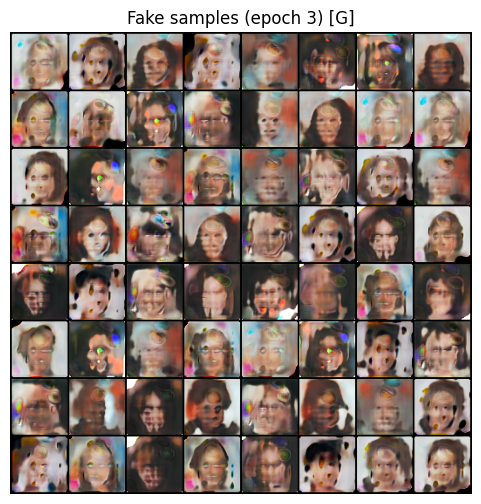

[Epoch 004/10] loss_D=0.9999 | loss_G=1.4063 | D(real)=1.30 | D(fake)=0.04 | Dsteps=1 | Gsteps=1
[Epoch 005/10] loss_D=1.0215 | loss_G=1.4058 | D(real)=1.35 | D(fake)=0.40 | Dsteps=1 | Gsteps=1
[Epoch 006/10] loss_D=0.9677 | loss_G=1.4949 | D(real)=1.21 | D(fake)=-2.47 | Dsteps=1 | Gsteps=1


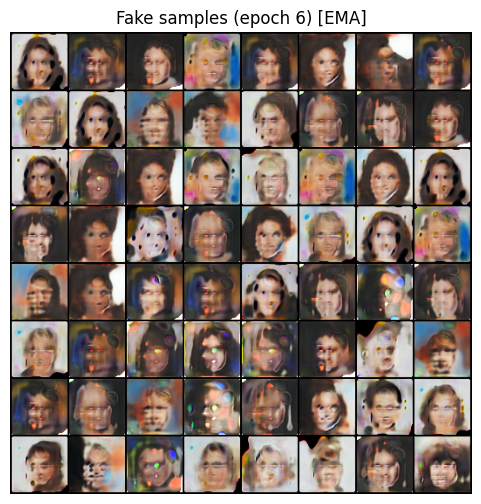

[Epoch 007/10] loss_D=1.0147 | loss_G=1.4635 | D(real)=1.27 | D(fake)=-2.37 | Dsteps=1 | Gsteps=1
[Epoch 008/10] loss_D=1.0519 | loss_G=1.2647 | D(real)=1.08 | D(fake)=0.12 | Dsteps=1 | Gsteps=1
[Epoch 009/10] loss_D=1.0292 | loss_G=1.3696 | D(real)=0.40 | D(fake)=-2.79 | Dsteps=1 | Gsteps=1


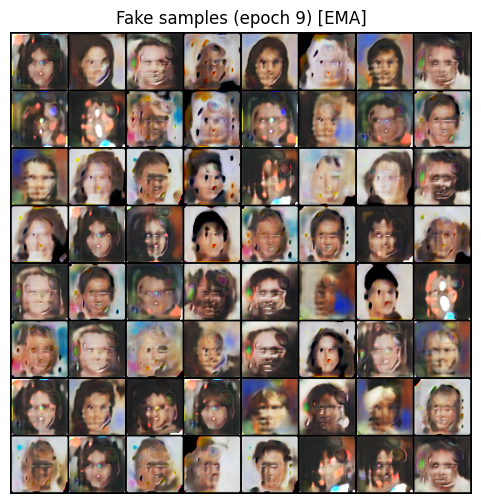

[Epoch 010/10] loss_D=1.0518 | loss_G=1.3269 | D(real)=0.94 | D(fake)=0.62 | Dsteps=1 | Gsteps=1


In [48]:
history = train_gan(
    train_loader=train_loader,   # CelebA 64×64
    generador=G,
    discriminador=D,
    optimizerG=optimizerG,
    optimizerD=optimizerD,
    criterion=criterion,         # ignorado si hinge=True
    latent_dim=512,
    epochs=10,
    gamma=10,                    # coeficiente de R1
    monitor_img=3,               # guarda/visualiza cada 5 epochs
    monitor_loss=1,
    train_gen=1,
    hinge=True,                  # Usamos HINGE + R1 porque no hay SN en discriminador
    disc_steps=1,                # 1 entrenamiento del discriminador
    g_warmup_epochs=0,
    g_warmup_train_gen=1,        # No entrenamos mas veces el generador
    use_ema=True,                # Usamos ema para predecir
    ema_decay=0.999,
    use_diffaug=True,
    r1_every=16,                 # Cada 16 steps R1 penalty
    style_mixing_prob=0.9)

In [49]:
from re import DEBUG

torch.save({
    'epoch': 45,
    'gen_state_dict': G.state_dict(),
    'disc_state_dict': D.state_dict(),
    'optimizer_gen_state_dict': optimizerG.state_dict(),
    'optimizer_disc_state_dict': optimizerD.state_dict(),
    'loss_G': history['loss_G'],
    'loss_D': history['loss_D']
}, "checkpoint_stylegan45.pth")

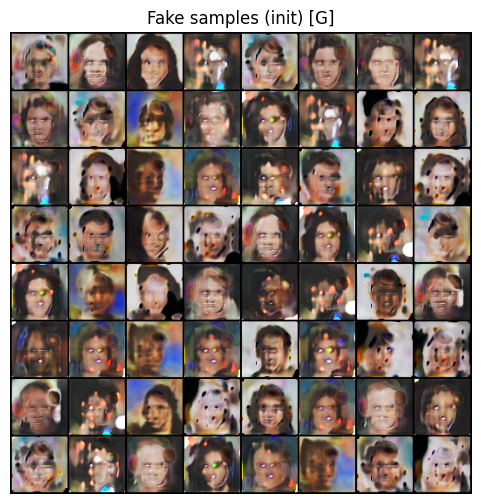

[Epoch 001/8] loss_D=1.0497 | loss_G=1.4427 | D(real)=0.85 | D(fake)=0.31 | Dsteps=1 | Gsteps=1
[Epoch 002/8] loss_D=1.0384 | loss_G=1.4108 | D(real)=1.26 | D(fake)=0.95 | Dsteps=1 | Gsteps=1
[Epoch 003/8] loss_D=1.0262 | loss_G=1.4635 | D(real)=0.38 | D(fake)=0.32 | Dsteps=1 | Gsteps=1


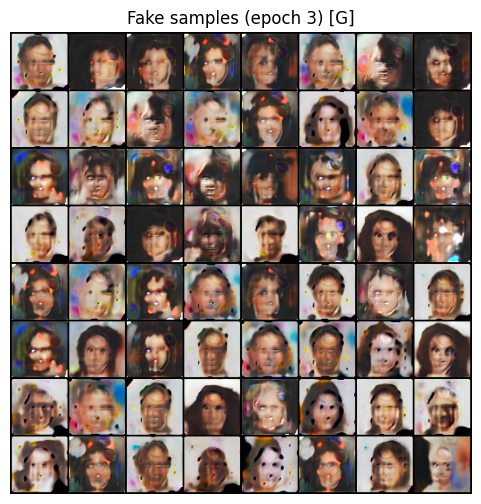

[Epoch 004/8] loss_D=0.9776 | loss_G=1.5085 | D(real)=0.17 | D(fake)=0.19 | Dsteps=1 | Gsteps=1
[Epoch 005/8] loss_D=1.0346 | loss_G=1.4124 | D(real)=1.09 | D(fake)=-3.83 | Dsteps=1 | Gsteps=1
[Epoch 006/8] loss_D=1.0418 | loss_G=1.4415 | D(real)=0.92 | D(fake)=0.44 | Dsteps=1 | Gsteps=1


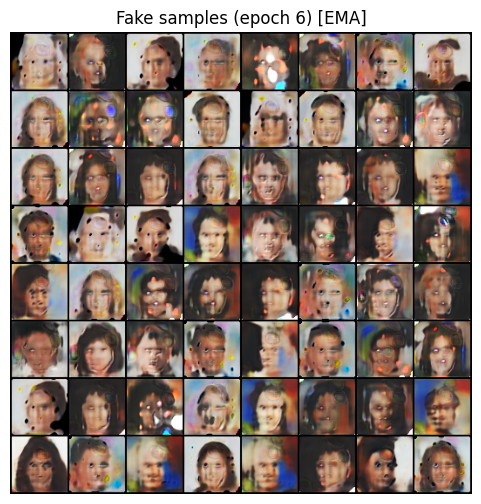

[Epoch 007/8] loss_D=1.0223 | loss_G=1.3891 | D(real)=0.50 | D(fake)=-0.82 | Dsteps=1 | Gsteps=1
[Epoch 008/8] loss_D=0.9999 | loss_G=1.4402 | D(real)=1.07 | D(fake)=-2.43 | Dsteps=1 | Gsteps=1


In [53]:
history = train_gan(
    train_loader=train_loader,   # CelebA 64×64
    generador=G,
    discriminador=D,
    optimizerG=optimizerG,
    optimizerD=optimizerD,
    criterion=criterion,         # ignorado si hinge=True
    latent_dim=512,
    epochs=8,
    gamma=7,                    # coeficiente de R1
    monitor_img=3,               # guarda/visualiza cada 5 epochs
    monitor_loss=1,
    train_gen=1,
    hinge=True,                  # Usamos HINGE + R1 porque no hay SN en discriminador
    disc_steps=1,                # 1 entrenamiento del discriminador
    g_warmup_epochs=0,
    g_warmup_train_gen=1,        # No entrenamos mas veces el generador
    use_ema=True,                # Usamos ema para predecir
    ema_decay=0.999,
    use_diffaug=True,
    r1_every=16,                 # Cada 16 steps R1 penalty
    style_mixing_prob=0.9)

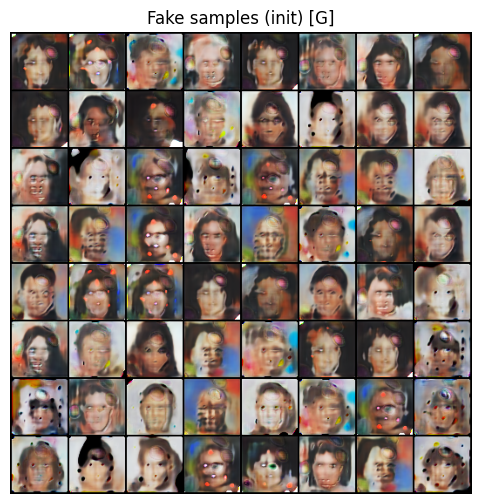

[Epoch 001/10] loss_D=1.0149 | loss_G=1.5330 | D(real)=1.03 | D(fake)=-2.40 | Dsteps=1 | Gsteps=1
[Epoch 002/10] loss_D=1.0102 | loss_G=1.4388 | D(real)=1.01 | D(fake)=-2.56 | Dsteps=1 | Gsteps=1
[Epoch 003/10] loss_D=0.9583 | loss_G=1.5365 | D(real)=0.65 | D(fake)=-3.02 | Dsteps=1 | Gsteps=1


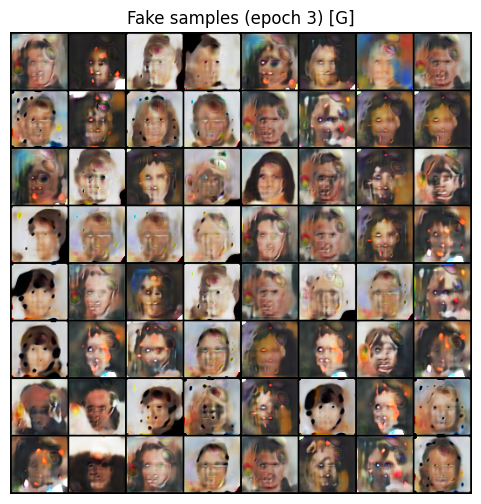

[Epoch 004/10] loss_D=1.0188 | loss_G=1.4724 | D(real)=1.43 | D(fake)=0.28 | Dsteps=1 | Gsteps=1
[Epoch 005/10] loss_D=1.0189 | loss_G=1.3821 | D(real)=1.06 | D(fake)=0.51 | Dsteps=1 | Gsteps=1
[Epoch 006/10] loss_D=0.9733 | loss_G=1.5142 | D(real)=0.37 | D(fake)=-3.60 | Dsteps=1 | Gsteps=1


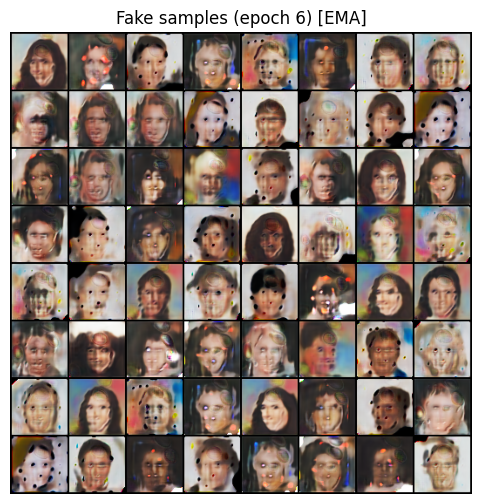

[Epoch 007/10] loss_D=0.9709 | loss_G=1.4380 | D(real)=0.87 | D(fake)=0.06 | Dsteps=1 | Gsteps=1
[Epoch 008/10] loss_D=1.0382 | loss_G=1.3609 | D(real)=0.44 | D(fake)=-0.60 | Dsteps=1 | Gsteps=1
[Epoch 009/10] loss_D=0.9928 | loss_G=1.5186 | D(real)=0.69 | D(fake)=-2.29 | Dsteps=1 | Gsteps=1


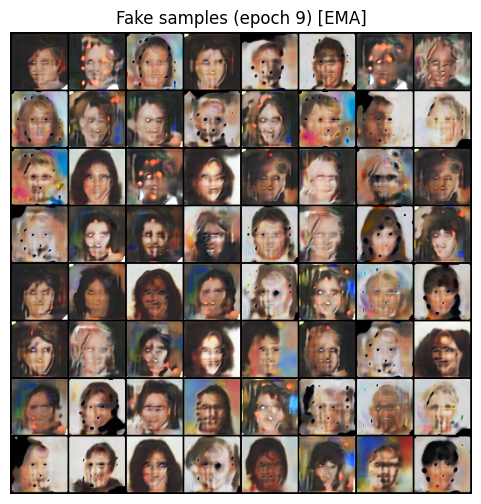

[Epoch 010/10] loss_D=1.0364 | loss_G=1.4188 | D(real)=1.23 | D(fake)=-2.10 | Dsteps=1 | Gsteps=1


In [54]:
history1 = train_gan(
    train_loader=train_loader,   # CelebA 64×64
    generador=G,
    discriminador=D,
    optimizerG=optimizerG,
    optimizerD=optimizerD,
    criterion=criterion,         # ignorado si hinge=True
    latent_dim=512,
    epochs=10,
    gamma=8,                    # coeficiente de R1
    monitor_img=3,               # guarda/visualiza cada 5 epochs
    monitor_loss=1,
    train_gen=1,
    hinge=True,                  # Usamos HINGE + R1 porque no hay SN en discriminador
    disc_steps=1,                # 1 entrenamiento del discriminador
    g_warmup_epochs=0,
    g_warmup_train_gen=1,        # No entrenamos mas veces el generador
    use_ema=True,                # Usamos ema para predecir
    ema_decay=0.999,
    use_diffaug=True,
    r1_every=16,                 # Cada 16 steps R1 penalty
    style_mixing_prob=0.9)

In [56]:
for param_group in optimizerG.param_groups:
    param_group['lr'] = 2.6e-3

for param_group in optimizerD.param_groups:
    param_group['lr'] = 2e-3

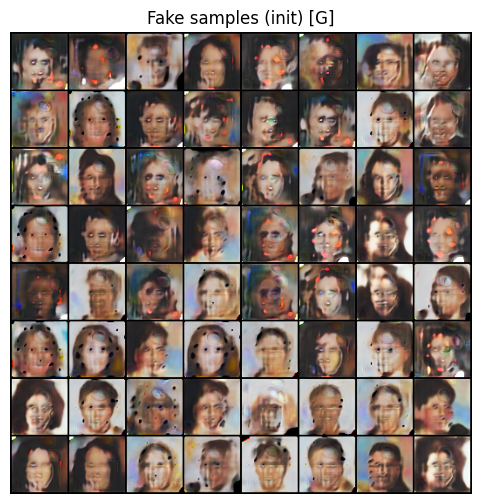

[Epoch 001/10] loss_D=0.9256 | loss_G=1.5962 | D(real)=1.16 | D(fake)=-1.96 | Dsteps=1 | Gsteps=1
[Epoch 002/10] loss_D=0.9153 | loss_G=1.6744 | D(real)=1.01 | D(fake)=0.56 | Dsteps=1 | Gsteps=1
[Epoch 003/10] loss_D=0.9424 | loss_G=1.5684 | D(real)=1.13 | D(fake)=-3.15 | Dsteps=1 | Gsteps=1


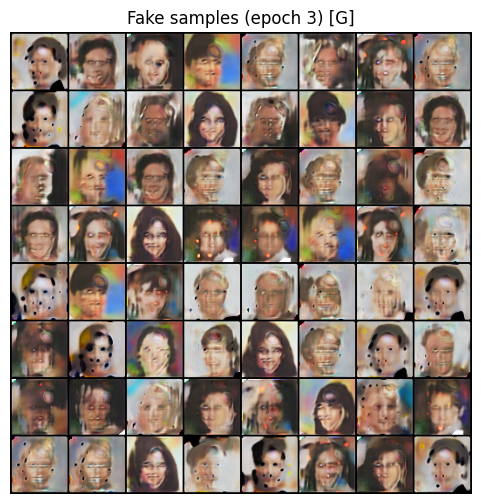

[Epoch 004/10] loss_D=0.9079 | loss_G=1.7074 | D(real)=0.87 | D(fake)=-2.78 | Dsteps=1 | Gsteps=1
[Epoch 005/10] loss_D=0.9431 | loss_G=1.5614 | D(real)=0.88 | D(fake)=-2.65 | Dsteps=1 | Gsteps=1
[Epoch 006/10] loss_D=0.9264 | loss_G=1.6375 | D(real)=0.75 | D(fake)=0.12 | Dsteps=1 | Gsteps=1


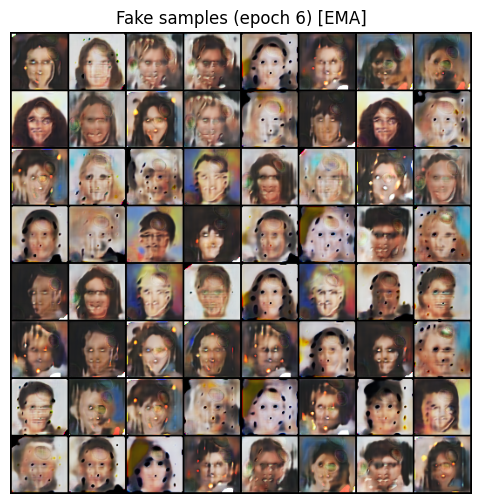

[Epoch 007/10] loss_D=0.9294 | loss_G=1.5536 | D(real)=0.77 | D(fake)=-2.53 | Dsteps=1 | Gsteps=1


In [ ]:
history1 = train_gan(
    train_loader=train_loader,   # CelebA 64×64
    generador=G,
    discriminador=D,
    optimizerG=optimizerG,
    optimizerD=optimizerD,
    criterion=criterion,         # ignorado si hinge=True
    latent_dim=512,
    epochs=10,
    gamma=5,                    # coeficiente de R1
    monitor_img=3,               # guarda/visualiza cada 5 epochs
    monitor_loss=1,
    train_gen=1,
    hinge=True,                  # Usamos HINGE + R1 porque no hay SN en discriminador
    disc_steps=1,                # 1 entrenamiento del discriminador
    g_warmup_epochs=0,
    g_warmup_train_gen=1,        # No entrenamos mas veces el generador
    use_ema=True,                # Usamos ema para predecir
    ema_decay=0.999,
    use_diffaug=True,
    r1_every=16,                 # Cada 16 steps R1 penalty
    style_mixing_prob=0.9)